<a href="https://colab.research.google.com/github/ashkwart/Ashley-Website/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
%config InlineBackend.figure_formats = ["retina"]

In [3]:
!pip install -q geopandas seaborn folium census

# Redlining

In [4]:
import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

from branca.utilities import color_brewer
from census import Census

In [5]:
census = Census("", year=2020)

We'll be pulling data (and inspiration) from the extraordinary University of Richmond project on redlining called [Mapping Inequality](https://dsl.richmond.edu/panorama/redlining/).  You should absolutely check out their stuff and click around.

In [6]:
areas_gdf = gpd.read_file("https://dsl.richmond.edu/panorama/redlining/static/mappinginequality.gpkg")

In [7]:
areas_gdf

,area_id,city,state,city_survey,category,grade,label,residential,commercial,industrial,fill,geometry
0,244,Birmingham,AL,True,Best,A,A1,True,False,False,#76a865,"MULTIPOLYGON (((-86.75678 33.49754, -86.75653 ..."
1,193,Birmingham,AL,True,Best,A,A2,True,False,False,#76a865,"MULTIPOLYGON (((-86.75867 33.50933, -86.76134 ..."
2,206,Birmingham,AL,True,Best,A,A3,True,False,False,#76a865,"MULTIPOLYGON (((-86.75678 33.49754, -86.75692 ..."
3,203,Birmingham,AL,True,Still Desirable,B,B1,True,False,False,#7cb5bd,"MULTIPOLYGON (((-86.80111 33.48071, -86.80505 ..."
4,189,Birmingham,AL,True,Still Desirable,B,B10,True,False,False,#7cb5bd,"MULTIPOLYGON (((-86.74923 33.53333, -86.74971 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...
10149,6518,Wheeling,WV,True,Hazardous,D,D4,True,False,False,#d9838d,"MULTIPOLYGON (((-80.71985 40.06376, -80.71943 ..."
10150,6520,Wheeling,WV,True,Hazardous,D,D5,True,False,False,#d9838d,"MULTIPOLYGON (((-80.72854 40.06729, -80.7287 4..."
10151,6516,Wheeling,WV,True,Hazardous,D,D6,True,False,False,#d9838d,"MULTIPOLYGON (((-80.72216 40.06134, -80.72247 ..."
10152,6512,Wheeling,WV,True,Hazardous,D,D7,True,False,False,#d9838d,"MULTIPOLYGON (((-80.6474 40.04886, -80.64842 4..."


Now we'll grab a dataset of redlining grades transfered onto U.S. census tracts from what's called the HRI (Historical Redlining Indicator).  

Meier, Helen C.S., and Mitchell, Bruce C. . Historic Redlining Indicator for 2000, 2010, and 2020 US Census Tracts. Ann Arbor, MI: Inter-university Consortium for Political and Social Research [distributor], 2023-09-25. https://doi.org/10.3886/E141121V3
(see [ICPSR](https://www.openicpsr.org/openicpsr/project/141121/version/V3/view?path=/openicpsr/141121/fcr:versions/V3.2&type=project))

In [8]:
hri_gdf = gpd.read_file("https://raw.githubusercontent.com/PUBPOL-2130/notebooks/refs/heads/main/data/HRI2020.zip")

In [9]:
hri_gdf

,OBJECTID_1,OBJECTID,GEOID20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,CBSA10,METRO_NAME,Shape_Leng,EQINTER20,Shape_Le_1,Shape_Area,HRI2020,RHRI2020,geometry
0,0,1,01097001502,848502.0,0.0,+30.6568785,-088.0688375,33681.0,"Mobile, AL",0.043989,4,0.043989,0.000080,3.924200,3.9,"POLYGON ((-88.07488 30.64997, -88.07459 30.650..."
1,0,3,01073004502,2953269.0,0.0,+33.5071040,-086.8031176,13820.0,"Birmingham-Hoover, AL",0.077309,4,0.077309,0.000287,3.939468,3.9,"POLYGON ((-86.81747 33.50731, -86.8174 33.5073..."
2,0,4,01073004501,723960.0,0.0,+33.4983380,-086.8072523,13820.0,"Birmingham-Hoover, AL",0.039856,4,0.039856,0.000070,3.551947,3.6,"POLYGON ((-86.81556 33.49672, -86.81517 33.497..."
3,0,6,01073002402,4990907.0,0.0,+33.5299121,-086.7865984,13820.0,"Birmingham-Hoover, AL",0.102104,4,0.102104,0.000484,3.997646,4.0,"POLYGON ((-86.80414 33.52829, -86.80397 33.528..."
4,0,7,01073002401,3488479.0,0.0,+33.5209629,-086.7775618,13820.0,"Birmingham-Hoover, AL",0.101521,4,0.101521,0.000339,3.751425,3.8,"POLYGON ((-86.79666 33.5172, -86.79389 33.5185..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13483,0,16596,55079007900,534569.0,24150.0,+43.0661920,-087.8957527,33340.0,"Milwaukee-Waukesha-West Allis,",0.037109,4,0.037109,0.000062,3.956915,4.0,"POLYGON ((-87.9004 43.06418, -87.90038 43.0652..."
13484,0,16597,55079008000,326024.0,0.0,+43.0674802,-087.9028298,33340.0,"Milwaukee-Waukesha-West Allis,",0.024456,4,0.024456,0.000036,4.000000,4.0,"POLYGON ((-87.90534 43.06421, -87.90533 43.065..."
13485,0,16598,55079007700,679121.0,21023.0,+43.0649318,-087.8886201,33340.0,"Milwaukee-Waukesha-West Allis,",0.038491,3,0.038491,0.000077,3.000000,3.0,"POLYGON ((-87.89505 43.06792, -87.89497 43.067..."
13486,0,16599,55079008100,278881.0,0.0,+43.0674717,-087.9074384,33340.0,"Milwaukee-Waukesha-West Allis,",0.023043,4,0.023043,0.000031,3.650345,3.7,"POLYGON ((-87.90961 43.06425, -87.9096 43.0653..."


In [10]:
atlanta_hri_gdf = hri_gdf[hri_gdf["METRO_NAME"] == "Atlanta-Sandy Springs-Roswell,"]
print(atlanta_hri_gdf)

      OBJECTID_1  OBJECTID      GEOID20    ALAND20  AWATER20   INTPTLAT20  \
2668           0      3279  13121009601   822057.0       0.0  +33.8463916   
2669           0      3280  13089022800  2440796.0       0.0  +33.7630331   
2670           0      3283  13089023000  1763510.0   21244.0  +33.7708628   
2671           0      3287  13121012300  3572640.0       0.0  +33.6613178   
2672           0      3289  13089020802  2697929.0       0.0  +33.7470922   
...          ...       ...          ...        ...       ...          ...   
2814           0      3491  13121006602   632427.0       0.0  +33.7186263   
2815           0      3492  13121006601  1929137.0       0.0  +33.7115643   
2818           0      3495  13121010601  2930344.0       0.0  +33.6610333   
2820           0      3501  13089022100  3399069.0   18701.0  +33.7906241   
2821           0      3504  13089020700  1264891.0       0.0  +33.7538960   

        INTPTLON20   CBSA10                      METRO_NAME  Shape_Leng  \


In [11]:
print(hri_gdf["METRO_NAME"].unique())

['Mobile, AL' 'Birmingham-Hoover, AL' 'Montgomery, AL'
 'Phoenix-Mesa-Scottsdale, AZ' 'Little Rock-North Little Rock-'
 'San Jose-Sunnyvale-Santa Clara' 'San Diego-Carlsbad, CA'
 'Los Angeles-Long Beach, CA' 'San Francisco-Oakland-Hayward,'
 'Fresno, CA' 'Sacramento--Roseville--Arden-A' 'Stockton-Lodi, CA'
 'Denver-Aurora-Lakewood, CO' 'Pueblo, CO' 'New Haven-Milford, CT'
 'Hartford-West Hartford-East Ha' 'Torrington, CT'
 'Bridgeport-Stamford-Norwalk, C' 'Miami-Fort Lauderdale-West Pal'
 'Tampa-St. Petersburg-Clearwate' 'Jacksonville, FL' 'Columbus, GA-AL'
 'Atlanta-Sandy Springs-Roswell,' 'Macon, GA' 'Savannah, GA'
 'Augusta-Richmond County, GA-SC' 'Chicago-Naperville-Elgin, IL-I'
 'Rockford, IL' 'Decatur, IL' 'St. Louis, MO-IL' 'Peoria, IL'
 'Springfield, IL' 'Fort Wayne, IN' 'Muncie, IN'
 'Indianapolis-Carmel-Anderson,' 'Evansville, IN-KY' 'Terre Haute, IN'
 'South Bend-Mishawaka, IN-MI' 'Des Moines-West Des Moines, IA'
 'Waterloo-Cedar Falls, IA' 'Omaha-Council Bluffs, NE-IA' 'Dub

Let's look at NYC!

In [12]:
queens_bronx_areas_gdf = areas_gdf[(areas_gdf["city"] == "Queens") | (areas_gdf["city"] == "Bronx")].copy()
queens_bronx_areas_gdf["score"] = queens_bronx_areas_gdf["grade"].map({"A": 3, "B": 2, "C": 1, "D": 0})
queens_bronx_areas_gdf

,area_id,city,state,city_survey,category,grade,label,residential,commercial,industrial,fill,geometry,score
6271,2736,Bronx,NY,True,Best,A,A1,True,False,False,#76a865,"MULTIPOLYGON (((-73.90345 40.91062, -73.90615 ...",3.0
6272,2738,Bronx,NY,True,Best,A,A2,True,False,False,#76a865,"MULTIPOLYGON (((-73.89916 40.89286, -73.89949 ...",3.0
6273,2737,Bronx,NY,True,Still Desirable,B,B1,True,False,False,#7cb5bd,"MULTIPOLYGON (((-73.90652 40.9006, -73.90522 4...",2.0
6274,2764,Bronx,NY,True,Still Desirable,B,B10,True,False,False,#7cb5bd,"MULTIPOLYGON (((-73.85101 40.85032, -73.84922 ...",2.0
6275,2775,Bronx,NY,True,Still Desirable,B,B11,True,False,False,#7cb5bd,"MULTIPOLYGON (((-73.83816 40.85735, -73.83685 ...",2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6812,2472,Queens,NY,True,Hazardous,D,D6,True,False,False,#d9838d,"MULTIPOLYGON (((-73.85912 40.75063, -73.86101 ...",0.0
6813,2473,Queens,NY,True,Hazardous,D,D7,True,False,False,#d9838d,"MULTIPOLYGON (((-73.85262 40.75252, -73.85424 ...",0.0
6814,2475,Queens,NY,True,Hazardous,D,D8,True,False,False,#d9838d,"MULTIPOLYGON (((-73.85494 40.74337, -73.8572 4...",0.0
6815,2474,Queens,NY,True,Hazardous,D,D9,True,False,False,#d9838d,"MULTIPOLYGON (((-73.85494 40.74337, -73.85476 ...",0.0


Not a lot of grade A terrain in Queens and the Bronx!

In [13]:
queens_bronx_areas_gdf["grade"].value_counts()

,count
grade,
C,134
D,46
B,28
A,3
E,1


In [14]:
queens_bronx_map = folium.Map([40.65, -73.95], zoom_start=12)
queens_bronx_choro = folium.Choropleth(
    geo_data=queens_bronx_areas_gdf,
    name="choropleth",
    data=queens_bronx_areas_gdf,
    columns=["area_id", "score"],
    key_on="feature.properties.area_id",
    fill_color="RdYlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Historic Redlining Indicator",
)
queens_bronx_choro.color_scale.colors = list(reversed(queens_bronx_choro.color_scale.colors))
queens_bronx_choro.add_to(queens_bronx_map)
queens_bronx_map

We can grab data for three metro areas.  Two out of three were easily covered by a single `METRO_NAME` but we had to do a little more work to find the GEOIDs associated with Houston.  

In [15]:
metro_areas = {
    "NYC": hri_gdf[hri_gdf["METRO_NAME"] == "New York-Newark-Jersey City, N"],
    "LA": hri_gdf[hri_gdf["METRO_NAME"] == "Los Angeles-Long Beach, CA"],
    "Houston": hri_gdf[hri_gdf["GEOID20"].str.startswith("48201")]
}

In [16]:
def plot_hri(gdf, center, zoom):
    hri_map = folium.Map(center, zoom_start=zoom)

    # ensure colors
    def reverse_color_brewer(*args, **kwargs):
        return list(reversed(color_brewer(*args, **kwargs)))

    folium.features.color_brewer = reverse_color_brewer
    choro = folium.Choropleth(
        geo_data=gdf,
        name="choropleth",
        data=gdf,
        columns=["GEOID20", "HRI2020"],
        key_on="feature.properties.GEOID20",
        fill_color="RdYlGn",
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name="Historic Redlining Indicator",
    )
    folium.features.color_brewer = color_brewer
    choro.add_to(hri_map)
    return hri_map

In [17]:
plot_hri(metro_areas["NYC"], center=[40.65, -73.95], zoom=12)

In [18]:
plot_hri(metro_areas["LA"], center=[34.06, -118.25], zoom=11)

In [19]:
plot_hri(metro_areas["Houston"], center=[29.76, -95.36], zoom=12)

Now we'll start some data prep to attach income information to the dataframe, so we can compare old redlining with persistent income gaps.

In [20]:
counties_by_metro_area = {
    metro_area: set(gdf["GEOID20"].str.slice(0, 5))
    for metro_area, gdf in metro_areas.items()
}
counties = set.union(*counties_by_metro_area.values())

In [21]:
median_income_raw = []
for county_fips in counties:
    print(county_fips)
    median_income_raw += census.acs5.get(
        (
            "B06011_001E",  # median income
        ),
        geo={
            "for": "tract:*",
            "in": f"state:{county_fips[:2]} county:{county_fips[2:]}",
        },
        year=2022,
    )

06037
48201
34017
36119
34013
36047
36081
36005
36085
34039
34035
34003
36061


In [22]:
median_income_df = pd.DataFrame(median_income_raw).rename(
    columns={
        "B06011_001E": "median_income",
    }
)
median_income_df["geoid"] = (
    median_income_df["state"]
    + median_income_df["county"]
    + median_income_df["tract"]
)
median_income_df = median_income_df.set_index("geoid")
median_income_df = median_income_df[median_income_df["median_income"] > 0]  # filter out negative sentinel values

Let's make a scatterplot of housing grades vs. current income levels.

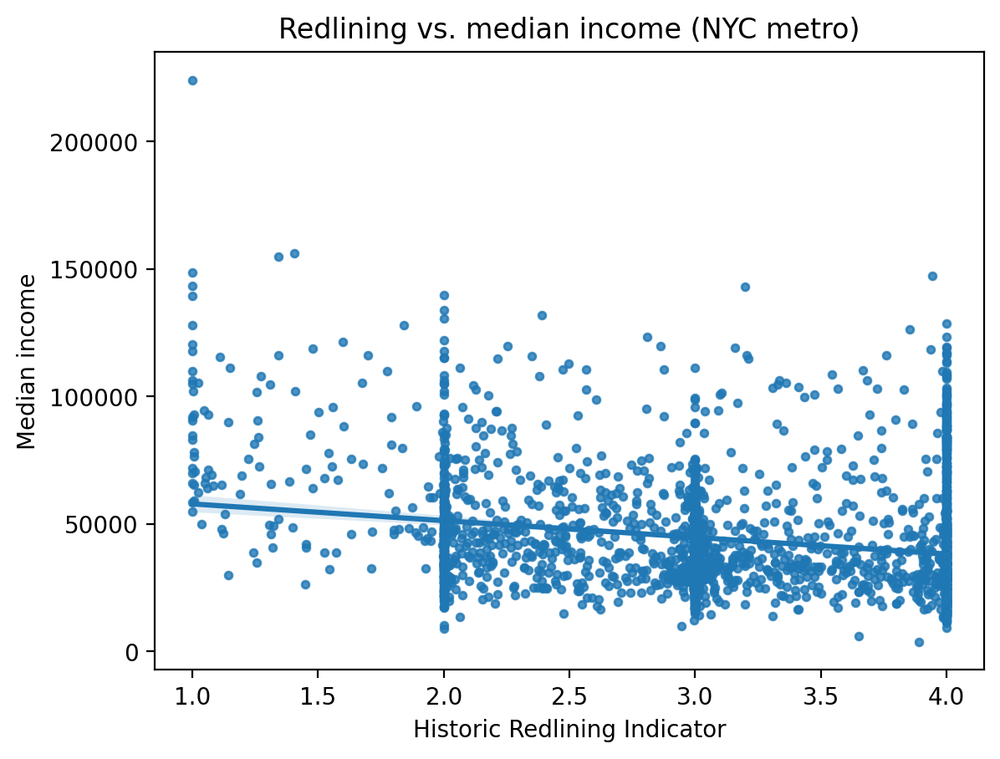

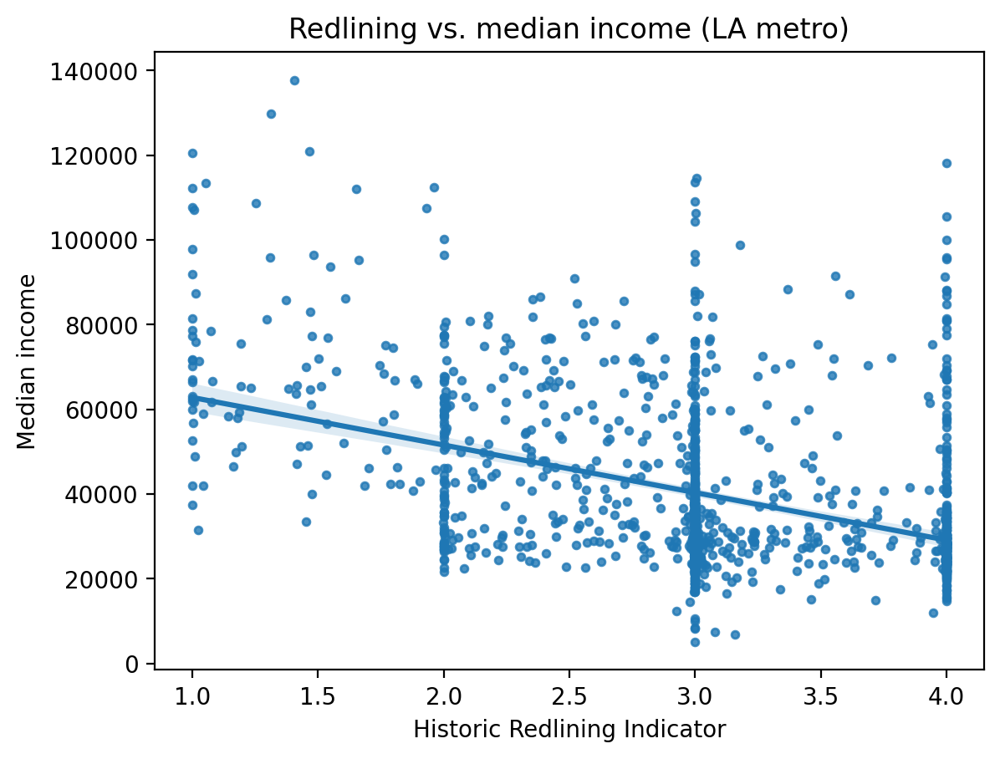

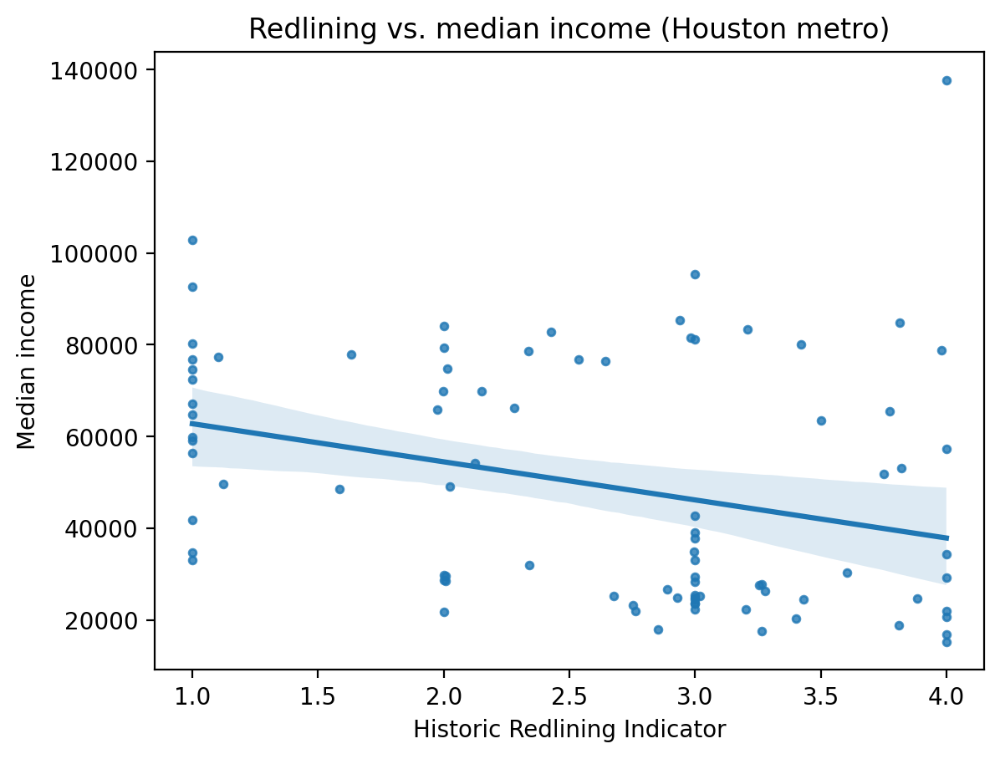

In [23]:
for label, gdf in metro_areas.items():
    sns.regplot(
        data=median_income_df.join(gdf.set_index("GEOID20")["HRI2020"]),
        x="HRI2020",
        y="median_income",
        scatter_kws={"s": 10},
    )
    plt.xlabel("Historic Redlining Indicator")
    plt.ylabel("Median income")
    plt.title(f"Redlining vs. median income ({label} metro)")
    plt.show()

Next, we'll bring back "KDE plots," which are smooth curves that capture some of the information in a distribution in an intuitive way.  Let's look at NYC, LA, and Houston and examine the distribution of median income.

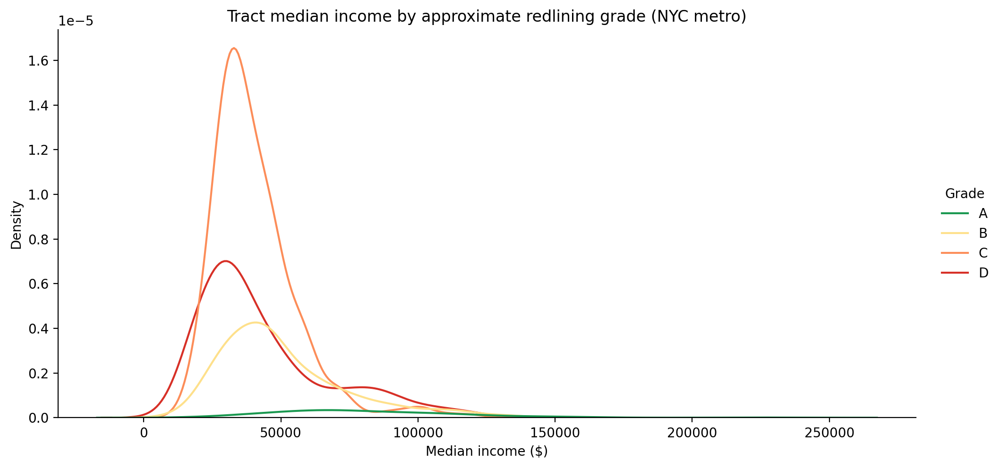

Medians of median income by grade:
Grade
A    72141.0
B    45383.0
C    36914.0
D    35391.0
Name: median_income, dtype: float64


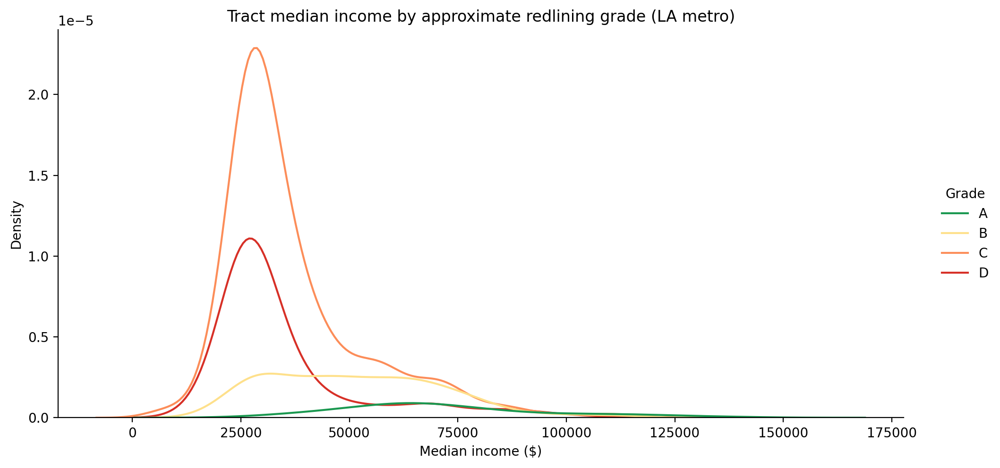

Medians of median income by grade:
Grade
A    66031.5
B    49874.0
C    30894.0
D    28491.0
Name: median_income, dtype: float64


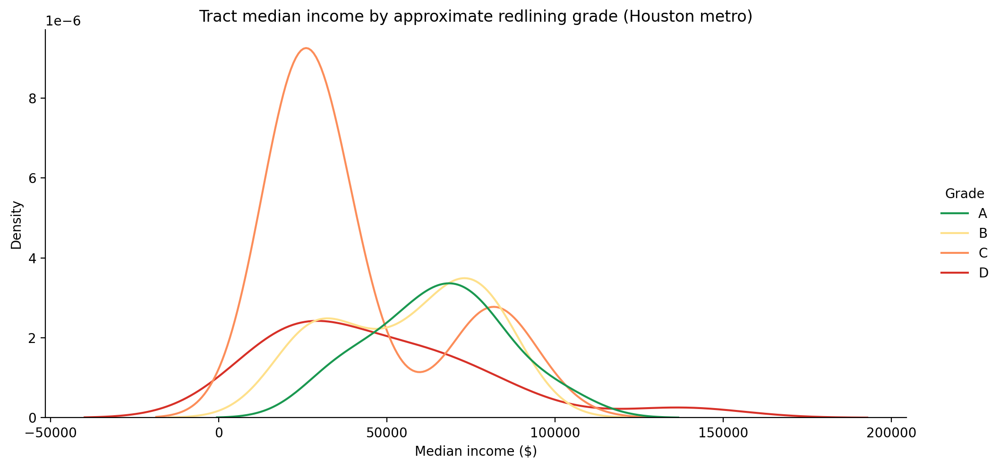

Medians of median income by grade:
Grade
A    65935.0
B    65796.0
C    26599.0
D    34291.0
Name: median_income, dtype: float64


In [24]:
displot_palette = list(reversed(color_brewer("RdYlGn")[:3] + color_brewer("RdYlGn")[5:]))

for label, gdf in metro_areas.items():
    df = median_income_df.join(gdf.set_index("GEOID20")["HRI2020"])
    df["Grade"] = df["HRI2020"].round().map({1: "A", 2: "B", 3: "C", 4: "D"})

    sns.displot(
        data=df,
        x="median_income",
        hue="Grade",
        kind="kde",
        fill=False,
        #alpha=0.15,
        height=5,
        aspect=2,
        palette=dict(zip(("A", "B", "C", "D"), displot_palette)),
        hue_order=("A", "B", "C", "D"),
    )

    plt.xlabel("Median income ($)")
    plt.title(f"Tract median income by approximate redlining grade ({label} metro)")
    plt.show()

    print("Medians of median income by grade:")
    print(df.groupby("Grade")["median_income"].median())

Now let's close out by comparing redlining grades to an index of "social vulnerability."  The SVI is an index that combines a number of factors drawn fron the ACS -- these include socioeconomic indicators (poverty, lack of health insurance), household characteristics (more elders and children, disability, low English proficiency), racial and ethnic minority status, and housing and transportation variables (no car, crowded living arrangements).

[CDC/ATSDR SVI 2022 Documentation](https://www.atsdr.cdc.gov/place-health/media/pdfs/2024/10/SVI2022Documentation.pdf) -- idea from ["From Redlining to Gentrification"](https://info.primarycare.hms.harvard.edu/perspectives/articles/redlining-gentrification-health-outcomes)

In [25]:
social_vuln_df = pd.read_csv("https://svi.cdc.gov/Documents/Data/2022/csv/states/SVI_2022_US.csv").set_index("FIPS")
social_vuln_df.index = social_vuln_df.index.astype(str).str.zfill(11)

In [26]:
social_vuln_df

,ST,STATE,ST_ABBR,STCNTY,COUNTY,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,...,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRACE,MP_OTHERRACE
FIPS,,,,,,,,,,,,,,,,,,,,,
01001020100,1,Alabama,AL,1001,Autauga County,Census Tract 201; Autauga County; Alabama,3.793569,1865,368,733,...,2.4,3.4,0.0,2.0,0.0,2.0,5.5,4.2,0.0,2.0
01001020200,1,Alabama,AL,1001,Autauga County,Census Tract 202; Autauga County; Alabama,1.282174,1861,396,680,...,0.0,2.0,0.0,2.0,0.0,2.0,7.3,6.3,0.4,0.9
01001020300,1,Alabama,AL,1001,Autauga County,Census Tract 203; Autauga County; Alabama,2.065364,3492,593,1431,...,0.3,0.5,0.0,1.1,0.0,1.1,4.2,5.2,0.0,1.1
01001020400,1,Alabama,AL,1001,Autauga County,Census Tract 204; Autauga County; Alabama,2.464984,3987,411,1722,...,0.6,0.6,0.2,0.3,0.0,0.9,2.9,2.6,0.0,0.9
01001020501,1,Alabama,AL,1001,Autauga County,Census Tract 205.01; Autauga County; Alabama,2.395243,4121,709,1857,...,2.4,4.1,0.0,0.9,0.0,0.9,1.0,1.3,0.0,0.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56043000200,56,Wyoming,WY,56043,Washakie County,Census Tract 2; Washakie County; Wyoming,2231.951435,3028,182,1580,...,0.6,0.8,0.3,0.5,0.0,1.2,2.0,1.5,0.1,0.1
56043000301,56,Wyoming,WY,56043,Washakie County,Census Tract 3.01; Washakie County; Wyoming,0.769579,2323,246,1128,...,0.0,1.6,0.3,0.5,0.0,1.6,2.6,2.5,0.8,1.0
56043000302,56,Wyoming,WY,56043,Washakie County,Census Tract 3.02; Washakie County; Wyoming,5.957251,2374,270,1148,...,0.5,0.9,0.3,0.8,0.0,1.6,5.1,3.1,0.0,1.6


In [27]:
social_vuln_df = social_vuln_df[social_vuln_df["RPL_THEMES"] > 0]

In [28]:
social_vuln_df["RPL_THEMES"]

,RPL_THEMES
FIPS,
01001020100,0.3635
01001020200,0.4155
01001020300,0.4843
01001020400,0.2386
01001020501,0.2059
...,...
56043000200,0.4548
56043000301,0.5458
56043000302,0.4005


In [29]:
gdf.set_index("GEOID20")[["HRI2020", "geometry"]].join(median_income_df)

,HRI2020,geometry,median_income,state,county,tract
GEOID20,,,,,,
48201411901,1.000000,"POLYGON ((-95.41061 29.73098, -95.41045 29.730...",102941.0,48,201,411901
48201410705,1.000000,"POLYGON ((-95.39943 29.73448, -95.39943 29.734...",33125.0,48,201,410705
48201320202,2.000000,"POLYGON ((-95.27811 29.68575, -95.27801 29.685...",21809.0,48,201,320202
48201320201,2.007045,"POLYGON ((-95.2779 29.70229, -95.27788 29.7026...",29547.0,48,201,320201
48201311501,2.999624,"POLYGON ((-95.29545 29.70213, -95.29527 29.702...",39132.0,48,201,311501
...,...,...,...,...,...,...
48201410900,1.000000,"POLYGON ((-95.41066 29.73356, -95.41065 29.734...",72500.0,48,201,410900
48201310200,3.812710,"POLYGON ((-95.36261 29.74496, -95.36226 29.745...",84904.0,48,201,310200
48201310300,2.341821,"POLYGON ((-95.34511 29.7344, -95.34505 29.7345...",31901.0,48,201,310300


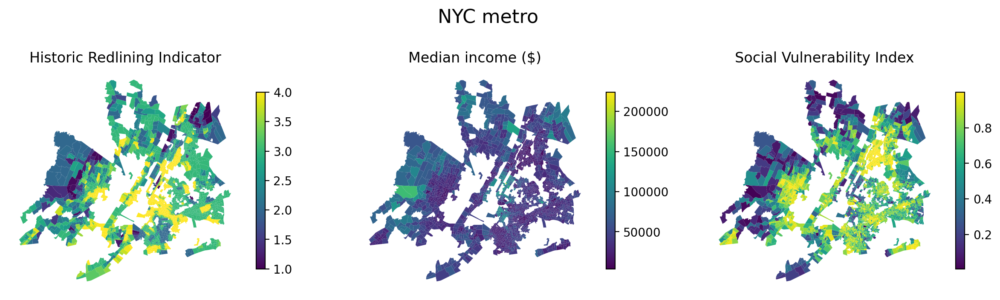

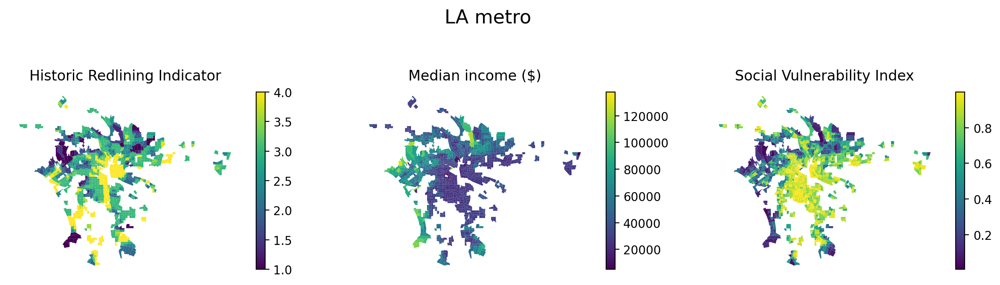

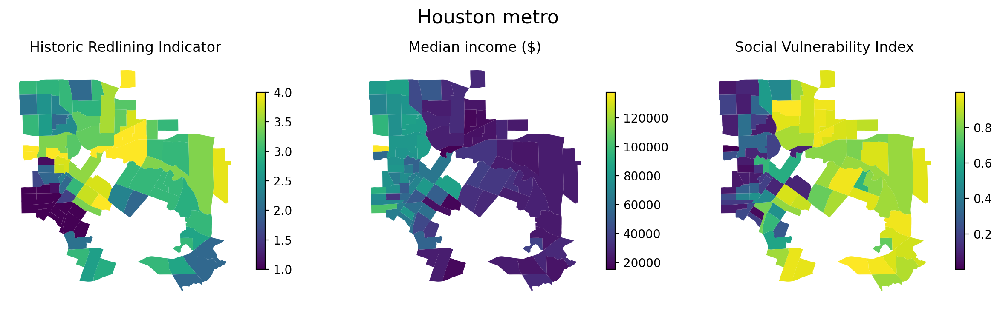

In [30]:
for label, gdf in metro_areas.items():
    joined_gdf = gpd.GeoDataFrame(
        gdf.set_index("GEOID20")[["HRI2020", "geometry"]].join(median_income_df).join(social_vuln_df["RPL_THEMES"]),
        crs=gdf.crs,
    )
    fig, axes = plt.subplots(1, 3, figsize=(15, 45))
    kwds = dict(legend_kwds={'shrink': 0.06}, legend=True)
    joined_gdf.plot(column="HRI2020", ax=axes[0], **kwds)
    joined_gdf.plot(column="median_income", ax=axes[1], **kwds)
    joined_gdf.plot(column="RPL_THEMES", ax=axes[2], **kwds)

    axes[0].set_title("Historic Redlining Indicator")
    axes[1].set_title("Median income ($)")
    axes[2].set_title("Social Vulnerability Index")
    fig.suptitle(f"{label} metro", y=0.54, fontsize=16)

    for ax in axes:
        ax.set_axis_off()

# Homework 8, due Friday April 18 (extended deadline Tuesday April 22, 1:25pm)

**Warmup question**: switch to a different metro area and create a plot of the HRI, median income, and SVI for that area.

**Data product**: use this notebook to get curious about some aspect of redlining. Formulate a question and make a data product that addresses it. Briefly explain how you made it.

**Reading question**: this week I've assigned a very short reading by Richard Rothstein where he summarizes his 2017 book *The Color of Law* and discusses what it would look like to remediate the *de jure* segregation of the 20th century. In it, he discusses why the wealth gap is larger than the income gap. Cite a related passage from the reading, giving a page number.  Then briefly expand on Rothstein's argument about income vs. wealth (either amplifying or pushing back).

**Warmup Question**

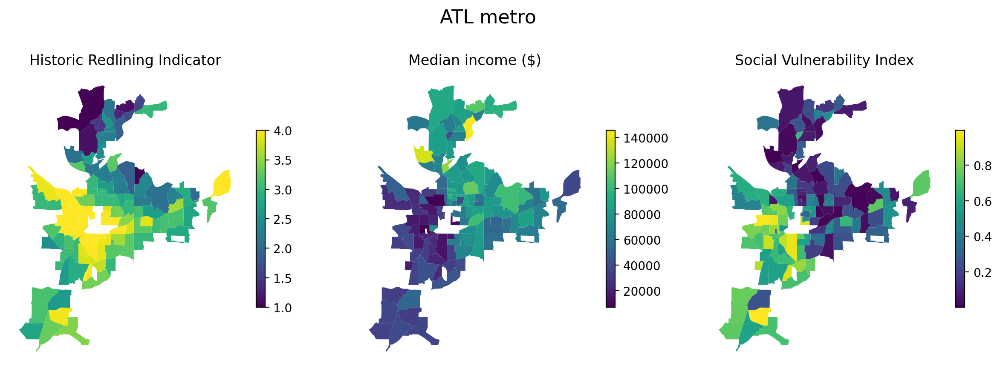

In [31]:
metro_areas = {
    "ATL": hri_gdf[hri_gdf["METRO_NAME"] == "Atlanta-Sandy Springs-Roswell,"],
}

counties_by_metro_area = {
    metro_area: set(gdf["GEOID20"].str.slice(0, 5))
    for metro_area, gdf in metro_areas.items()
}
counties = set.union(*counties_by_metro_area.values())

median_income_raw = []
for county_fips in counties:
    # print(county_fips)
    median_income_raw += census.acs5.get(
        (
            "B06011_001E",
        ),
        geo={
            "for": "tract:*",
            "in": f"state:{county_fips[:2]} county:{county_fips[2:]}",
        },
        year=2022,
    )

median_income_df = pd.DataFrame(median_income_raw).rename(
    columns={
        "B06011_001E": "median_income",
    }
)
median_income_df["geoid"] = (
    median_income_df["state"]
    + median_income_df["county"]
    + median_income_df["tract"]
)
median_income_df = median_income_df.set_index("geoid")
median_income_df = median_income_df[median_income_df["median_income"] > 0]  # filter out negative sentinel values


for label, gdf in metro_areas.items():
    joined_gdf = gpd.GeoDataFrame(
        gdf.set_index("GEOID20")[["HRI2020", "geometry"]].join(median_income_df).join(social_vuln_df["RPL_THEMES"]),
        crs=gdf.crs,
    )
    fig, axes = plt.subplots(1, 3, figsize=(15, 45))
    kwds = dict(legend_kwds={'shrink': 0.06}, legend=True)
    joined_gdf.plot(column="HRI2020", ax=axes[0], **kwds)
    joined_gdf.plot(column="median_income", ax=axes[1], **kwds)
    joined_gdf.plot(column="RPL_THEMES", ax=axes[2], **kwds)

    axes[0].set_title("Historic Redlining Indicator")
    axes[1].set_title("Median income ($)")
    axes[2].set_title("Social Vulnerability Index")
    fig.suptitle(f"{label} metro", y=0.55, fontsize=16)


    for ax in axes:
        ax.set_axis_off()

    plt.savefig("atl_metro_graph.png", bbox_inches='tight')

count    5.000000e+02
mean     3.988638e+05
std      2.374076e+05
min      5.610000e+04
25%      2.136750e+05
50%      3.368000e+05
75%      5.291500e+05
max      1.724100e+06
Name: median_home_value, dtype: float64


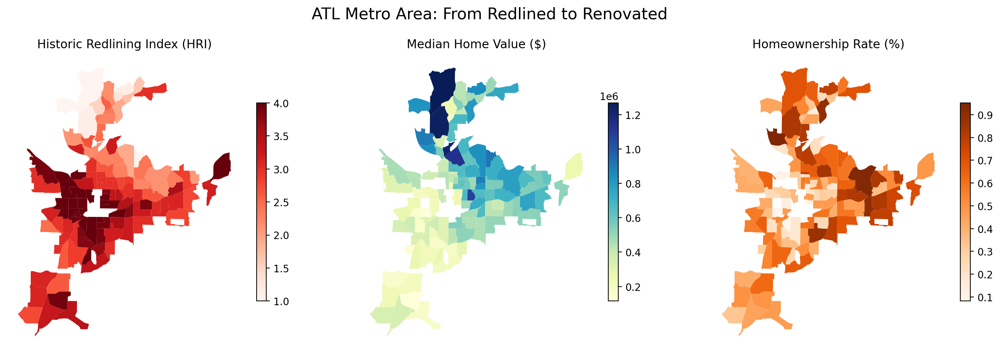

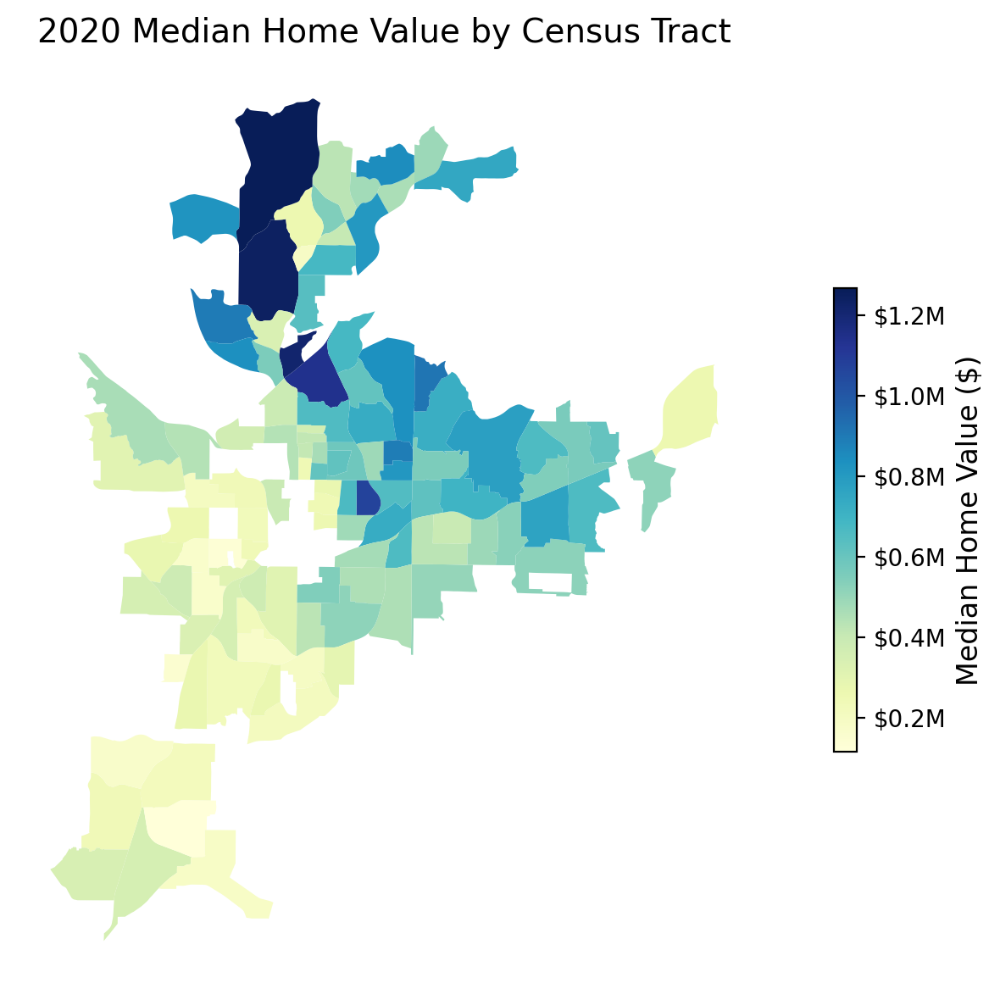

In [38]:
# Add these variables to pull
home_value_vars = [
    "B25077_001E",  # Median home value
    "B25003_001E",  # Total housing units
    "B25003_002E",  # Owner-occupied units
]

home_value_raw = []
for county_fips in counties:
    home_value_raw += census.acs5.get(
        home_value_vars,
        geo={
            "for": "tract:*",
            "in": f"state:{county_fips[:2]} county:{county_fips[2:]}",
        },
        year=2022,
    )

home_value_df = pd.DataFrame(home_value_raw).rename(
    columns={
        "B25077_001E": "median_home_value",
        "B25003_001E": "total_units",
        "B25003_002E": "owner_occupied",
    }
)

home_value_df["geoid"] = (
    home_value_df["state"]
    + home_value_df["county"]
    + home_value_df["tract"]
)

home_value_df["homeownership_rate"] = (
    pd.to_numeric(home_value_df["owner_occupied"], errors="coerce") /
    pd.to_numeric(home_value_df["total_units"], errors="coerce")
)
home_value_df = home_value_df.set_index("geoid")

# Convert to numeric (if you haven’t already)
home_value_df["median_home_value"] = pd.to_numeric(
    home_value_df["median_home_value"], errors="coerce"
)

# Remove placeholder values and unreasonable outliers
home_value_df = home_value_df[
    (home_value_df["median_home_value"] > 10000) &
    (home_value_df["median_home_value"] < 2000000)
]

print(home_value_df["median_home_value"].describe())

for label, gdf in metro_areas.items():
    joined_gdf = gpd.GeoDataFrame(
        gdf.set_index("GEOID20")[["HRI2020", "geometry"]]
        .join(median_income_df)
        .join(home_value_df[["median_home_value", "homeownership_rate"]])
        .join(social_vuln_df["RPL_THEMES"]),
        crs=gdf.crs,
    )

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    kwds = dict(legend_kwds={'shrink': 0.6}, legend=True)

    joined_gdf.plot(column="HRI2020", ax=axes[0], cmap="Reds", **kwds)
    joined_gdf.plot(column="median_home_value", ax=axes[1], cmap="YlGnBu", **kwds)
    joined_gdf.plot(column="homeownership_rate", ax=axes[2], cmap="Oranges", **kwds)

    axes[0].set_title("Historic Redlining Index (HRI)")
    axes[1].set_title("Median Home Value ($)")
    axes[2].set_title("Homeownership Rate (%)")

    for ax in axes:
        ax.set_axis_off()

    fig.suptitle(f"{label} Metro Area: From Redlined to Renovated", y=0.95, fontsize=16)
    # plt.savefig("redlined_to_renovated.png", bbox_inches='tight')


from matplotlib.ticker import FuncFormatter

# Define a function to format numbers as dollars in millions
def millions_formatter(x, pos):
    return f"${x/1_000_000:.1f}M"

# Plotting with formatted colorbar (legend)
fig, ax = plt.subplots(figsize=(10, 6))

# Set vmin and vmax for consistent coloring
vmin = joined_gdf["median_home_value"].min()
vmax = joined_gdf["median_home_value"].max()

# Plot the map
plot = joined_gdf.plot(
    column="median_home_value",
    cmap="YlGnBu",
    ax=ax,
    legend=True,
    vmin=vmin,
    vmax=vmax,
    legend_kwds={"shrink": 0.5}
)

# Customize legend/ colorbar
cbar = plot.get_figure().get_axes()[-1]
cbar.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
cbar.set_ylabel("Median Home Value ($)", fontsize=12)

# Set title and remove axes
ax.set_title("2020 Median Home Value by Census Tract", fontsize=14)
ax.set_axis_off()

plt.tight_layout()
plt.show()



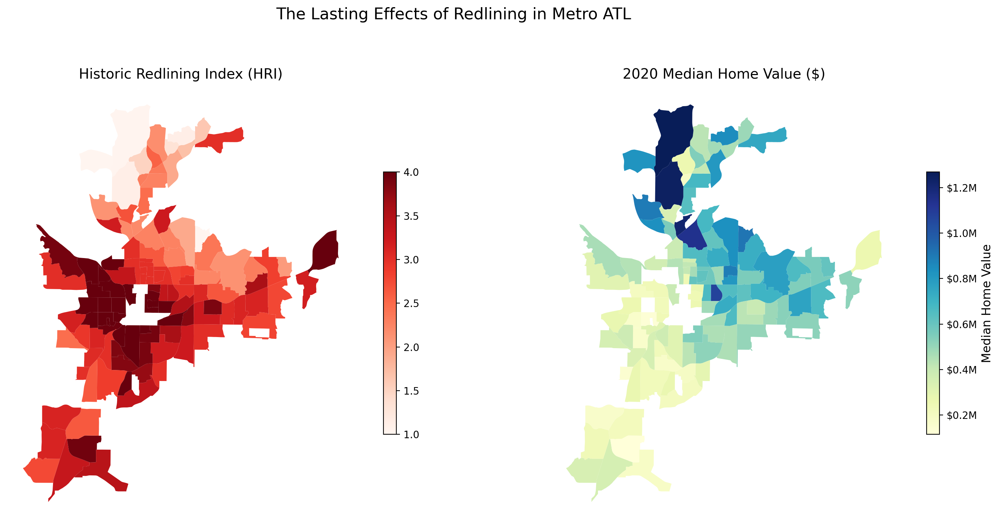

In [43]:
from matplotlib.ticker import FuncFormatter

for label, gdf in metro_areas.items():
    joined_gdf = gpd.GeoDataFrame(
        gdf.set_index("GEOID20")[["HRI2020", "geometry"]]
        .join(home_value_df[["median_home_value"]]),
        crs=gdf.crs,
    )

    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    fig.suptitle("The Lasting Effects of Redlining in Metro ATL ", fontsize=16, y=1.05)

    # HRI Plot
    joined_gdf.plot(
        column="HRI2020",
        cmap="Reds",
        ax=axes[0],
        legend=True,
        legend_kwds={"shrink": 0.6}
    )
    axes[0].set_title("Historic Redlining Index (HRI)", fontsize=14)
    axes[0].set_axis_off()

    # Median Home Value Plot
    vmin = joined_gdf["median_home_value"].min()
    vmax = joined_gdf["median_home_value"].max()

    plot = joined_gdf.plot(
        column="median_home_value",
        cmap="YlGnBu",
        ax=axes[1],
        legend=True,
        vmin=vmin,
        vmax=vmax,
        legend_kwds={"shrink": 0.6}
    )
    axes[1].set_title("2020 Median Home Value ($)", fontsize=14)
    axes[1].set_axis_off()

    # Format the home value colorbar
    cbar = plot.get_figure().get_axes()[-1]
    cbar.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"${x/1_000_000:.1f}M"))
    cbar.set_ylabel("Median Home Value", fontsize=12)

    plt.savefig("redlining_metro_atl", bbox_inches='tight')
    plt.tight_layout()
    plt.show()


To what extent has gentrification reshaped the demographic and economic impacts of redlining in Atlanta from 2000 to 2020?

How Have Income and Racial Demographics Changed in Redlined vs. Non-Redlined Areas (2000–2020)?

**A dual-axis line graph (or two overlaid line graphs) showing:**

Median household income (y-axis 1)

% Black or Hispanic population (y-axis 2, or separate but aligned graph)

X-axis = Year (2000, 2010, 2020)

**Two lines per variable: one for redlined tracts, one for non-redlined tracts**

This lets people compare:

Whether income went up in both areas

Whether racial demographics shifted more in redlined areas (aka gentrification)

Whether redlined areas "caught up" or were displaced



In [ ]:
import numpy as np
home_value_2020 = []
for county_fips in counties:
    home_value_2020 += census.acs5.get(
        ("B25077_001E",),  # Median home value
        geo={
            "for": "tract:*",
            "in": f"state:{county_fips[:2]} county:{county_fips[2:]}"
        },
        year=2020
    )

home_value_2020_df = pd.DataFrame(home_value_2020).rename(
    columns={"B25077_001E": "median_home_value_2020"}
)
home_value_2020_df["geoid"] = (
    home_value_2020_df["state"] +
    home_value_2020_df["county"] +
    home_value_2020_df["tract"]
)
home_value_2020_df = home_value_2020_df.set_index("geoid")
home_value_2020_df["median_home_value_2020"] = pd.to_numeric(
    home_value_2020_df["median_home_value_2020"], errors="coerce"
)
for label, gdf in metro_areas.items():
    joined_gdf = gpd.GeoDataFrame(
        gdf.set_index("GEOID20")[["HRI2020", "geometry"]]
        .join(home_value_2020_df),
        crs=gdf.crs,
    ).dropna(subset=["median_home_value_2020"])

# Apply log transformation to home values to compress extreme values
joined_gdf["log_home_value_2020"] = np.log(joined_gdf["median_home_value_2020"])

# Plotting
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
joined_gdf.plot(column="HRI2020", cmap="Reds", legend=True, ax=axes[0])
joined_gdf.plot(column="log_home_value_2020", cmap="YlGnBu", legend=True, ax=axes[1])

print(joined_gdf["median_home_value_2020"].describe())


axes[0].set_title("Historic Redlining Index")
axes[1].set_title("2020 Median Home Value (Log Scale)")

for ax in axes:
    ax.set_axis_off()

plt.suptitle(f"{label} Metro Area: Gentrification in Redlined Areas", y=0.95)

In [44]:
plot_hri(metro_areas["ATL"], center=[29.76, -95.36], zoom=12)